In [1]:
%config InlineBackend.figure_format = 'retina'

In [2]:
import cmcrameri
import matplotlib as mpl
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import polars as pl
import seaborn as sns
from scipy import stats

import textalloc as ta

from dv_score import io, spatial
from dv_score.viz import viz, moe_style_context


In [3]:
sns.set_theme(font_scale=1, style="ticks", palette="tab10", context="talk")
dv_cmap = viz.dv_cmap()

# MERFISH data
* Detected OSNs expressing ORs
* see [spatial_filter_OR_transcripts.py](../scripts/analysis/spatial_filter_OR_transcripts.py) and [spatial_identify_cells.py](../scripts/analysis/spatial_identify_cells.py) scripts for identifying OR-expressing OSNs from the preprocessed `detected_transcripts.csv` file, which can be found at [GEO:GSE297068](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE297068).

In [4]:
def update_ax(ax):
    ax.set_xlim(-2200, 2200)
    ax.set_ylim(-2600, 2500)
    ax.set_aspect("equal")
    ax.axis("off")

In [5]:
ALIGN_COL = "pwl_rescale"
df_merfish_pred, df_res_keep = io.load_merfish()
df_trans_gene_mean = df_merfish_pred.groupby("gene").mean()

res_vc = df_res_keep.gene.value_counts()
res_use = res_vc.index[res_vc >= 20]
df_res_mean = df_res_keep.groupby("gene").mean(numeric_only=True).loc[res_use]
xt = df_merfish_pred.sgx
yt = df_merfish_pred.sgy

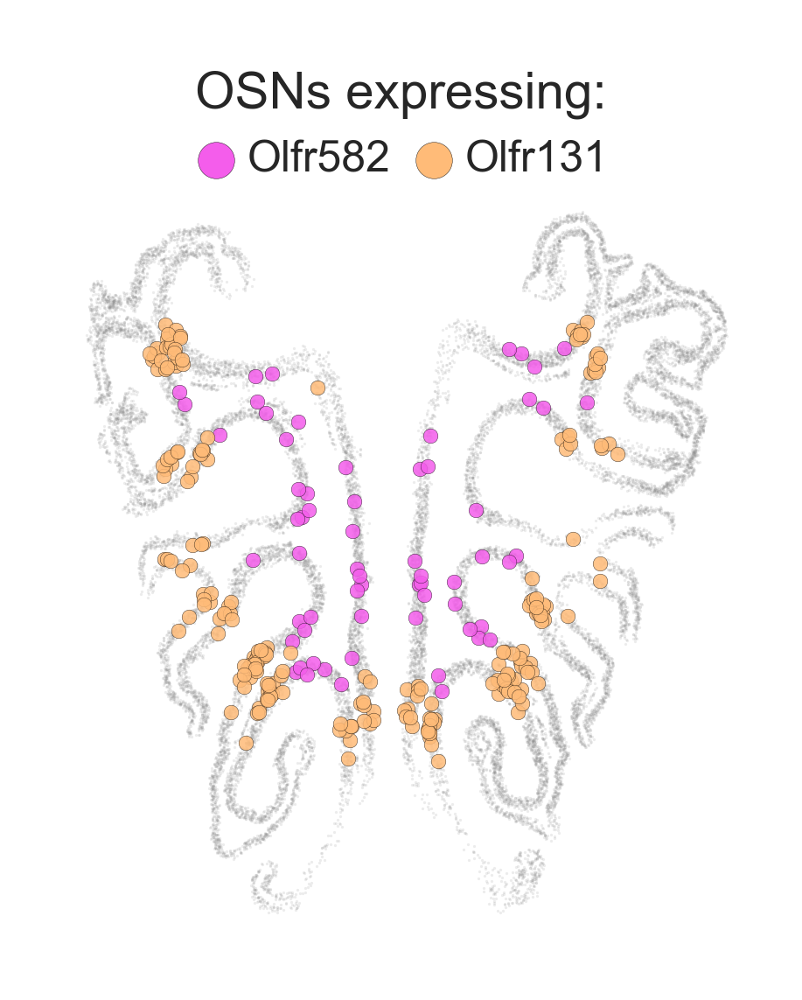

In [6]:
olfrs = ["Olfr582", "Olfr131"]
olfr_colors = [sns.husl_palette(7)[-1], plt.cm.tab20(3)]
with moe_style_context():
    fig, ax = plt.subplots(figsize=(2, 2))
    ax.scatter(xt, yt, color="0.5", lw=0, alpha=0.15, s=0.15, rasterized=True)
    for olfr, color in zip(olfrs, olfr_colors):
        is_v = df_merfish_pred.gene == olfr
        ax.scatter(
            xt[is_v],
            yt[is_v],
            color=color,
            lw=0.05,
            s=4,
            alpha=0.85,
            ec="k",
            label=olfr,
            rasterized=True,
        )
    update_ax(ax)
    leg = ax.legend(
        title="OSNs expressing:",
        ncols=2,
        markerscale=2.5,
        columnspacing=0.5,
        loc="lower center",
        bbox_to_anchor=(0.5, 0.9),
        handlelength=1,
        handletextpad=0.2,
    )
    for lh in leg.legend_handles:
        lh.set_alpha(1)

In [7]:
def plot_insert(color=df_merfish_pred["y_DV"], vmax=350, tick=150):
    fig, ax = plt.subplots(1, 1, figsize=(2, 2), sharex=True, sharey=True)
    im = ax.scatter(
        xt,
        yt,
        c=color,
        lw=0,
        alpha=0.85,
        s=0.15,
        cmap=dv_cmap,
        rasterized=True,
        vmin=-vmax,
        vmax=vmax,
    )
    update_ax(ax)
    cax = fig.add_axes([0.85, 0.17, 0.05, 0.6])
    cbar = plt.colorbar(im, cax)
    viz.update_cbar(cbar)
    cax.yaxis.set_major_locator(mpl.ticker.MultipleLocator(tick))
    axins = ax.inset_axes(
        [-0.05, -0.45, 1, 0.45],
        facecolor=None,
        zorder=-10,
        xlim=(320, 1950),
        ylim=(200, 1050),
    )
    axins.scatter(
        xt,
        yt,
        c=color,
        lw=0,
        alpha=0.85,
        s=0.75,
        cmap=dv_cmap,
        rasterized=True,
        vmin=-vmax,
        vmax=vmax,
    )
    axins.set_xticks([])
    axins.set_yticks([])
    for spine in axins.spines.values():
        spine.set_linewidth(0.5)
    inset_indicator = ax.indicate_inset_zoom(axins, edgecolor="black", linewidth=0.5)
    for c in inset_indicator[1]:
        c.set_linewidth(0.5)
    return fig, ax

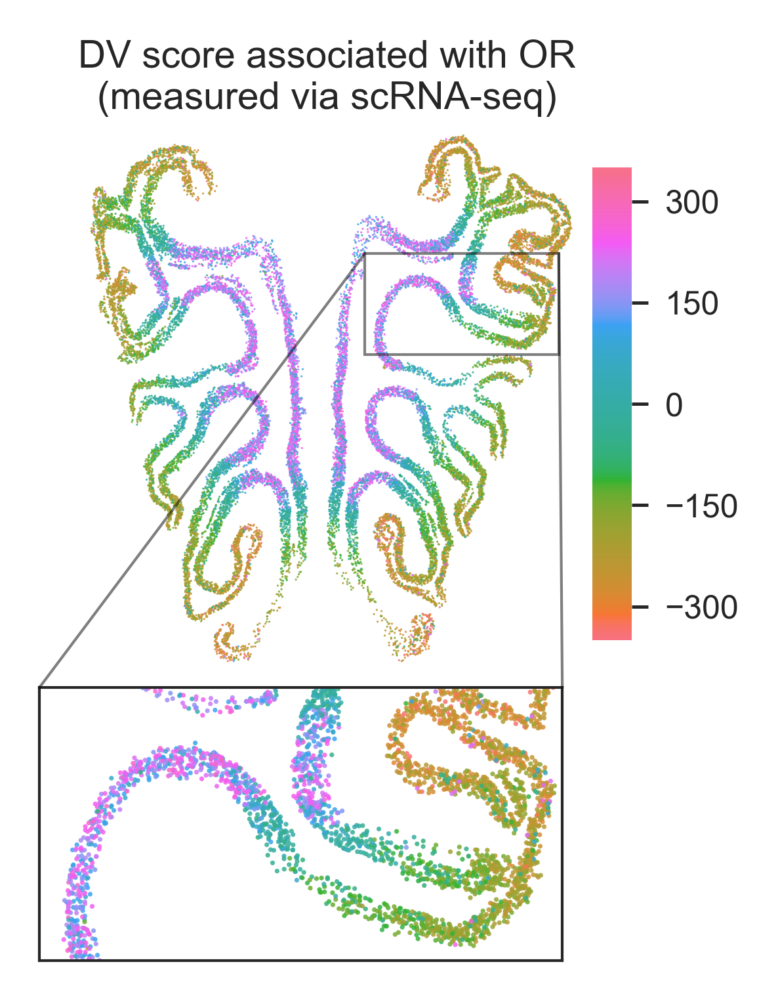

In [8]:
with moe_style_context():
    fig, ax = plot_insert()
    ax.set_title("DV score associated with OR\n(measured via scRNA-seq)", y=0.9)

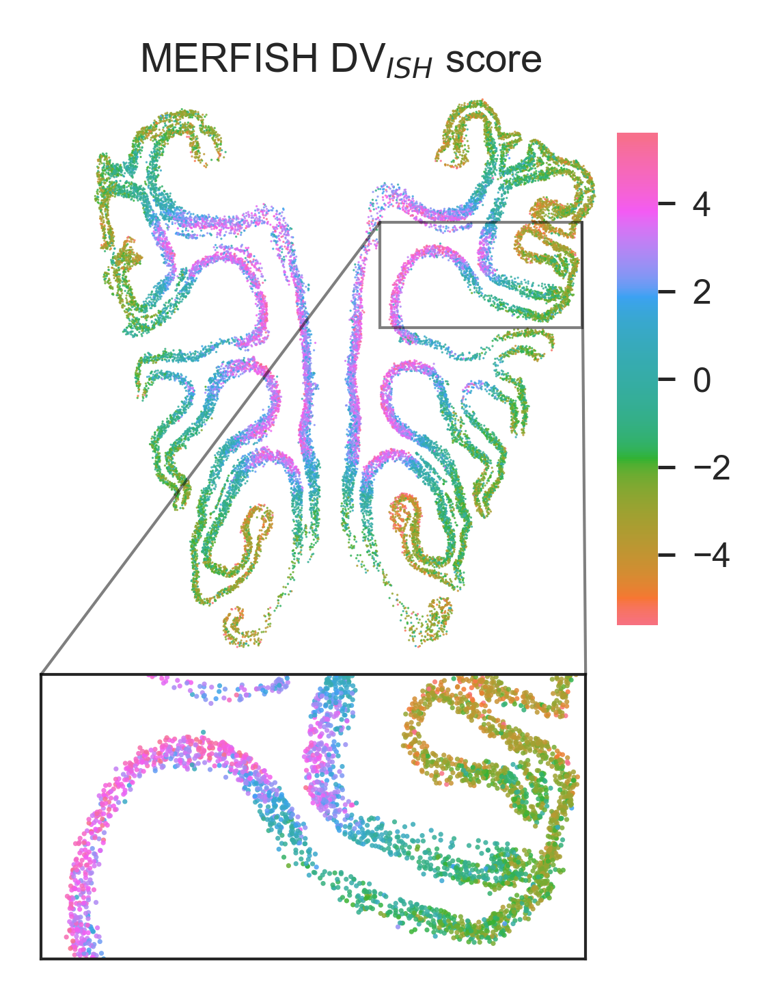

In [9]:
with moe_style_context():
    color = df_merfish_pred['vPC']
    vmax = np.percentile(np.abs(color), 99.5)
    fig, ax = plot_insert(color, vmax, 2)
    ax.set_title("MERFISH DV$_{ISH}$ score", y=0.9)

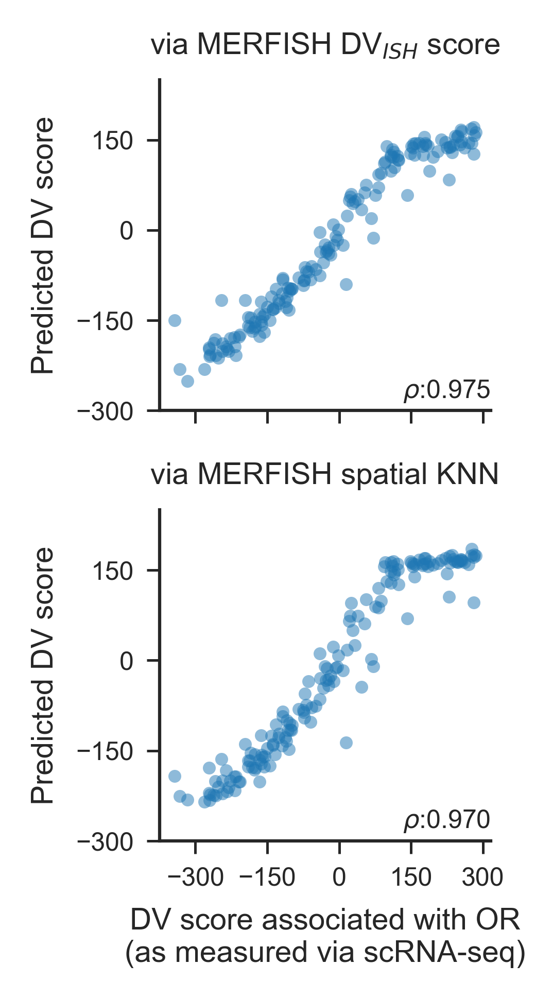

In [10]:
# hold cells from one OR out and run regression with DV_ISH score or KNN regression with their scRNA-seq associated DV scores
with moe_style_context():
    fig, axes = plt.subplots(2, 1, figsize=(1.65, 3.2), sharex=True, sharey=True)
    for ax, col, title in zip(
        axes, ("pred_DV", "global_knn"), ("via MERFISH DV$_{ISH}$ score", "via MERFISH spatial KNN")
    ):
        ax.scatter(df_trans_gene_mean.y_DV, df_trans_gene_mean[col], s=9, alpha=0.5, lw=0)
        ax.set_title(title, y=1)
        ax.set_box_aspect(1)
        ax.set_ylabel("Predicted DV score")
        viz.plot_r(ax, df_trans_gene_mean.y_DV, df_trans_gene_mean[col])

    ax.set_ylim(-300, 250)
    ax.yaxis.set_major_locator(mpl.ticker.MultipleLocator(150))
    ax.xaxis.set_major_locator(mpl.ticker.MultipleLocator(150))
    sns.despine()

    plt.subplots_adjust(wspace=0.1, hspace=0.3)
    ax.set_xlabel("DV score associated with OR\n(as measured via scRNA-seq)")

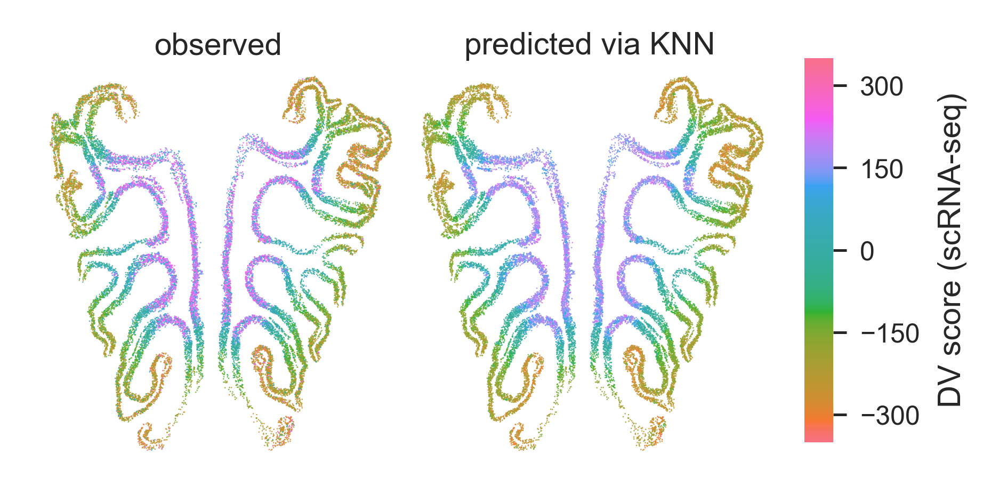

In [11]:
with moe_style_context():
    fig, axes = plt.subplots(1, 2, figsize=(3, 2), sharex=True, sharey=True)
    for ax, col, t in zip(axes, ("y_DV", "global_knn"), ("observed", "predicted via KNN")):
        im = ax.scatter(
            xt,
            yt,
            c=df_merfish_pred[col],
            lw=0,
            alpha=0.85,
            s=0.1,
            vmin=-350,
            vmax=350,
            cmap=dv_cmap,
            rasterized=True
        )
        ax.set_title(t, y=0.9)
        update_ax(ax)
    plt.subplots_adjust(wspace=0)
    cax = fig.add_axes([0.93, 0.2, 0.03, 0.6])
    cbar = plt.colorbar(im, cax)
    cbar.set_label("DV score (scRNA-seq)")
    viz.update_cbar(cbar)
    cax.yaxis.set_major_locator(mpl.ticker.MultipleLocator(150))

## MERFISH common coordinates
* map ORs to common coordinate system using piecewise linear regression

In [12]:
from sklearn.preprocessing import LabelEncoder
from sklearn.neighbors import NearestNeighbors

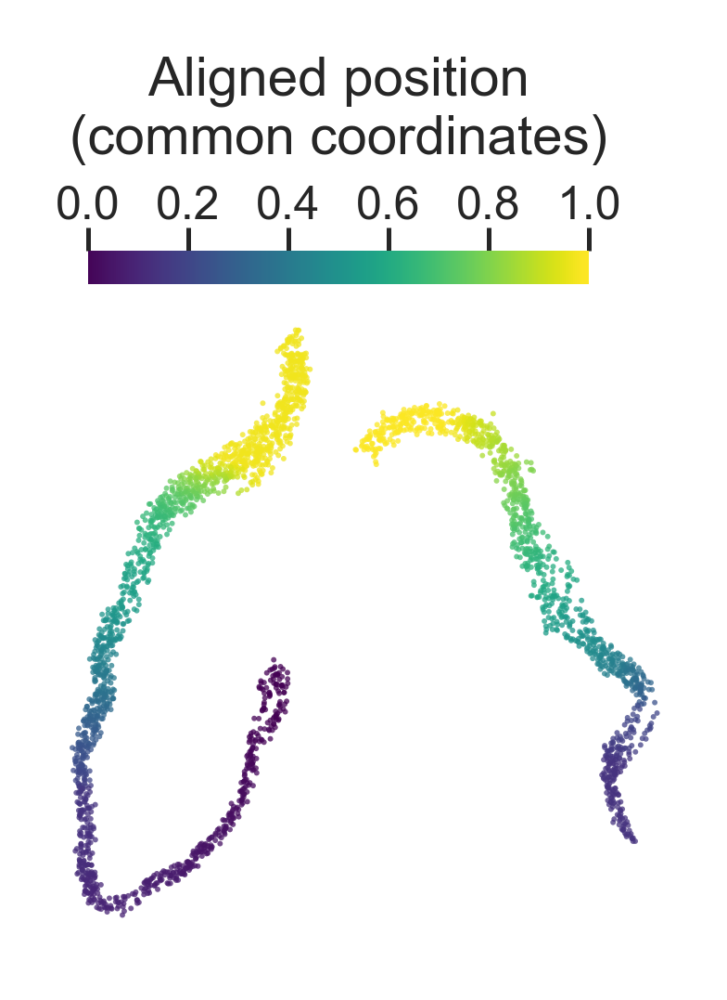

In [13]:
with moe_style_context():
    fig, axes = plt.subplots(1, 2, figsize=(1.5, 1.5))
    regions = (13, 26)
    for ax, r in zip(axes, regions):
        _df = df_res_keep[df_res_keep.annotation == r]
        im1 = ax.scatter(
            _df.sgx,
            _df.sgy,
            c=_df.pwl_rescale,
            vmin=0,
            vmax=1,
            cmap="viridis",
            lw=0,
            alpha=0.75,
            s=0.5,
        )
    for ax in axes.flat:
        ax.set_aspect("equal")
        ax.axis("off")
    plt.subplots_adjust(wspace=-0.05, hspace=0.4)

    cax1 = fig.add_axes([0.2, 0.9, 0.6, 0.04])
    cbar1 = fig.colorbar(im1, cax=cax1, orientation="horizontal")
    cax1.xaxis.set_label_position("top")
    cax1.xaxis.set_ticks_position("top")
    cax1.xaxis.set_tick_params(pad=0)
    cbar1.set_label("Aligned position\n(common coordinates)")
    cax1.xaxis.set_major_locator(mpl.ticker.MultipleLocator(0.2))
    viz.update_cbar(cbar1)

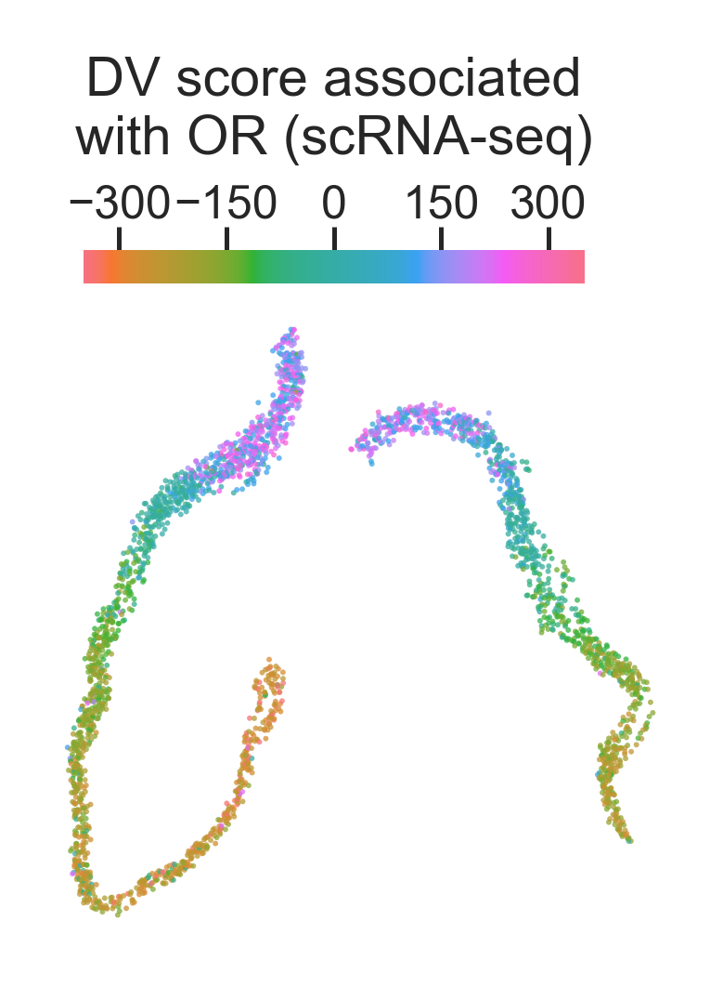

In [14]:
with moe_style_context():
    fig, axes = plt.subplots(1, 2, figsize=(1.5, 1.5))
    regions = (13, 26)
    for ax, r in zip(axes, regions):
        _df = df_res_keep[df_res_keep.annotation == r]
        im1 = ax.scatter(
            _df.sgx,
            _df.sgy,
            c=_df.DV,
            vmin=-350,
            vmax=350,
            cmap=dv_cmap,
            lw=0,
            alpha=0.75,
            s=0.5,
        )
    for ax in axes.flat:
        ax.set_aspect("equal")
        ax.axis("off")
    plt.subplots_adjust(wspace=-0.05, hspace=0.4)

    cax1 = fig.add_axes([0.2, 0.9, 0.6, 0.04])
    cbar1 = fig.colorbar(im1, cax=cax1, orientation="horizontal")
    cax1.xaxis.set_label_position("top")
    cax1.xaxis.set_ticks_position("top")
    cax1.xaxis.set_tick_params(pad=0)
    cbar1.set_label("DV score associated\nwith OR (scRNA-seq)")
    cax1.xaxis.set_major_locator(mpl.ticker.MultipleLocator(150))
    viz.update_cbar(cbar1)

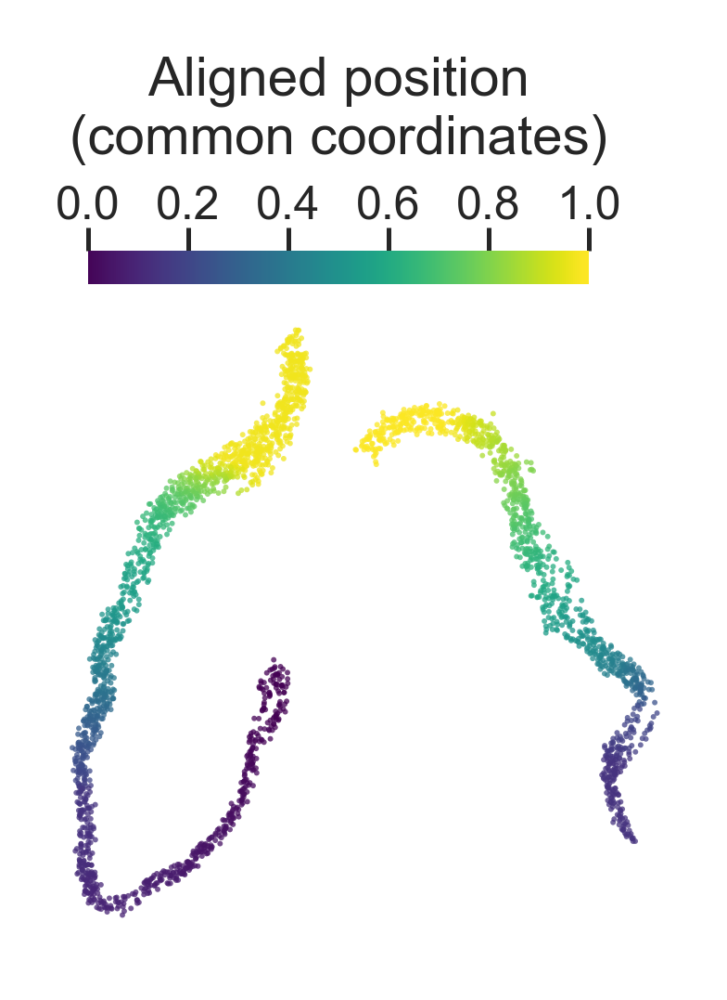

In [15]:
with moe_style_context():
    fig, axes = plt.subplots(1, 2, figsize=(1.5, 1.5))
    regions = (13, 26)
    for ax, r in zip(axes, regions):
        _df = df_res_keep[df_res_keep.annotation == r]
        im1 = ax.scatter(
            _df.sgx,
            _df.sgy,
            c=_df.pwl_rescale,
            vmin=0,
            vmax=1,
            cmap="viridis",
            lw=0,
            alpha=0.75,
            s=0.5,
        )
    for ax in axes.flat:
        ax.set_aspect("equal")
        ax.axis("off")
    plt.subplots_adjust(wspace=-0.05, hspace=0.4)

    cax1 = fig.add_axes([0.2, 0.9, 0.6, 0.04])
    cbar1 = fig.colorbar(im1, cax=cax1, orientation="horizontal")
    cax1.xaxis.set_label_position("top")
    cax1.xaxis.set_ticks_position("top")
    cax1.xaxis.set_tick_params(pad=0)
    cbar1.set_label("Aligned position\n(common coordinates)")
    cax1.xaxis.set_major_locator(mpl.ticker.MultipleLocator(0.2))
    viz.update_cbar(cbar1)

In [16]:
df_gep_mean = io.load_gep_mean(to_pandas=True)
example_olfrs = ["Olfr392", "Olfr131", "Olfr211", "Olfr479"]
example_order = df_gep_mean.loc[example_olfrs].sort_values("DV").index

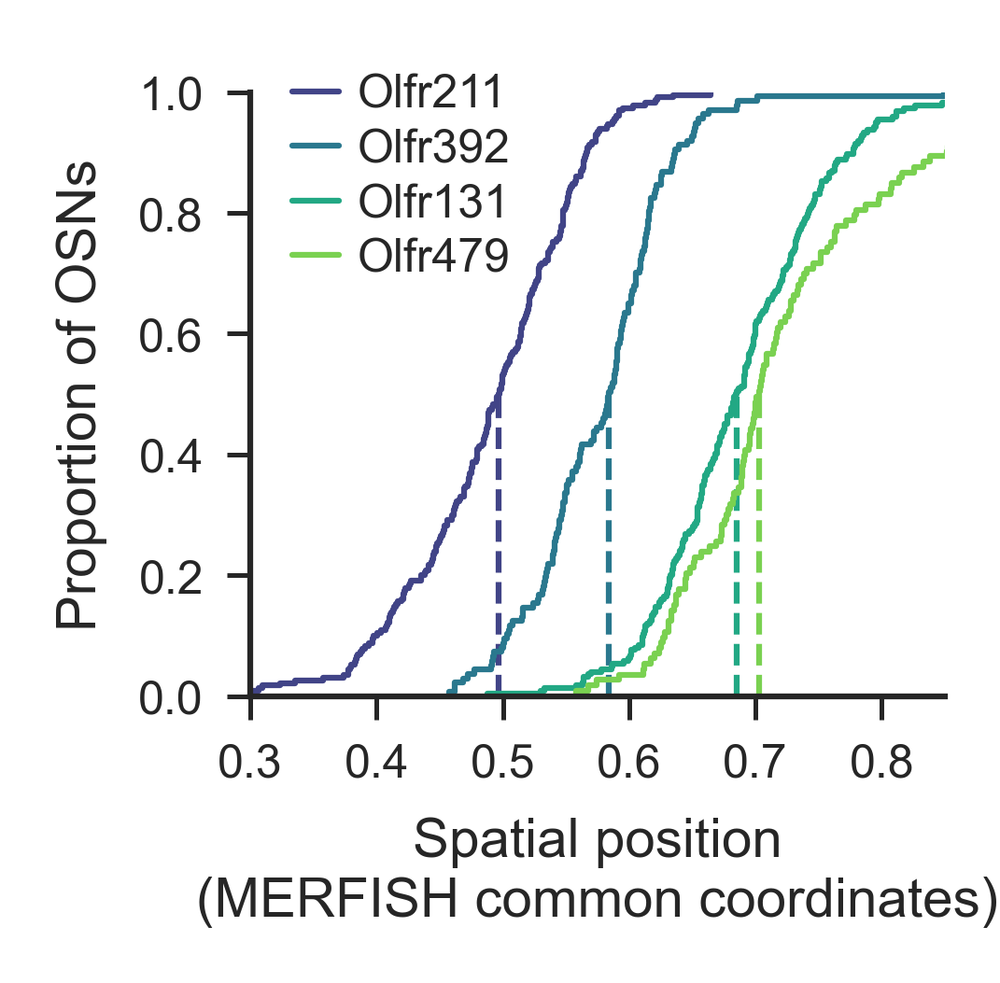

In [17]:
colors = sns.color_palette("viridis", 4)
with moe_style_context():
    fig, ax = plt.subplots(
        1, 1, figsize=(1.6, 1.4)
    )
    for i, olfr in enumerate(example_order):
        this_df = df_res_keep[df_res_keep.gene == olfr]
        sns.ecdfplot(this_df[ALIGN_COL], lw=0.75, label=olfr, color=colors[i])
        med = this_df[ALIGN_COL].median()
        ax.plot([med, med], [0, 0.5], ls="--", color=colors[i], lw=0.75)
    ax.legend(
        handlelength=1,
        labelspacing=0.25,
        handletextpad=0.4,
        loc="upper left",
        bbox_to_anchor=(0, 1.1),
    )
    ax.set_xlim(0.3, 0.85)
    ax.set_xlabel("Spatial position\n(MERFISH common coordinates)")
    ax.set_ylabel("Proportion of OSNs")
    sns.despine(ax=ax)
    ax.yaxis.set_major_locator(mpl.ticker.MultipleLocator(0.2))
    ax.xaxis.set_major_locator(mpl.ticker.MultipleLocator(0.1))

In [18]:
olfrs_plot = [
    "Olfr1508",
    "Olfr1336",
    "Olfr535",
    "Olfr211",
    "Olfr392",
    "Olfr131",
    "Olfr693",
    "Olfr368",
    "Olfr976",
    "Olfr582",
]

df_res_plot = df_res_mean.loc[olfrs_plot]
df_res_other = df_res_mean.loc[df_res_mean.index.difference(olfrs_plot)]

/Users/davidbrann/miniconda3/envs/dv_score/lib/python3.9/site-packages/textalloc/__init__.py:538: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  p = ax.transData.transform((x[i], y[i]))


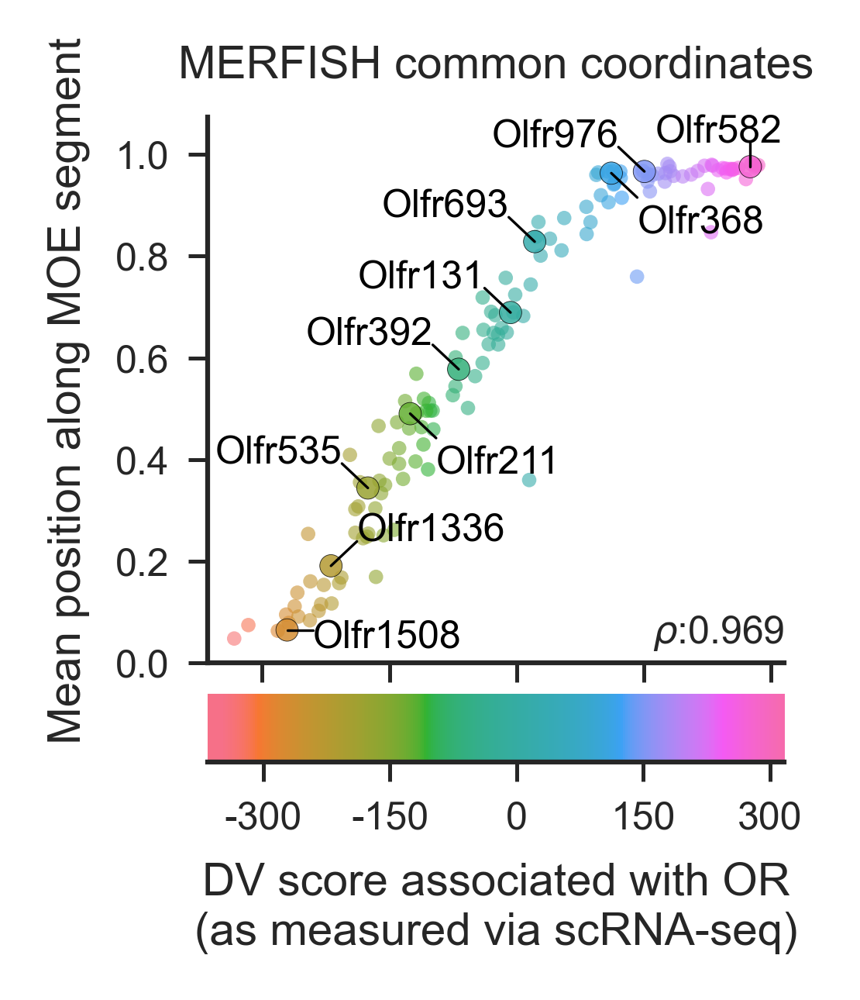

In [19]:
with moe_style_context():
    fig, (ax, ax1) = plt.subplots(
        2, 1, figsize=(1.6, 1.8), gridspec_kw={"height_ratios": [16, 2]}
    )
    ax.scatter(
        df_res_other.DV,
        df_res_other[ALIGN_COL],
        c=df_res_other.DV,
        vmin=-350,
        vmax=350,
        s=5,
        alpha=0.6,
        lw=0,
        cmap=dv_cmap,
    )
    ax.scatter(
        df_res_plot.DV,
        df_res_plot[ALIGN_COL],
        c=df_res_plot.DV,
        vmin=-350,
        vmax=350,
        s=12,
        alpha=0.85,
        lw=0.1,
        cmap=dv_cmap,
        ec="k",
    )
    _x = df_res_plot.DV
    _y = df_res_plot[ALIGN_COL]

    text_list = df_res_plot.index
    ta.allocate(
        ax,
        _x,
        _y,
        text_list,
        x_scatter=_x,
        y_scatter=_y,
        textsize=6,
        linecolor="k",
        textcolor="k",
        linewidth=0.4,
        min_distance=0.045,
        avoid_label_lines_overlap=True,
        priority_strategy=42,
        avoid_crossing_label_lines=True,
        margin=0.03,
        ylims=(0, 1.2),
    )
    ax.set_ylim(0, None)
    ax.yaxis.set_major_locator(mpl.ticker.MultipleLocator(0.2))
    ax.xaxis.set_major_locator(mpl.ticker.MultipleLocator(150))
    ax.set_xticklabels([])
    sns.despine()
    ax1.set_xlabel("DV score associated with OR\n(as measured via scRNA-seq)")
    ax.set_ylabel("Mean position along MOE segment")
    ax.set_title("MERFISH common coordinates")
    viz.plot_r(ax, df_res_mean.DV, df_res_mean[ALIGN_COL])
    h = np.linspace(*ax.get_xlim(), 256)
    ax1.imshow(h[None, :],  vmin=-350,
        vmax=350, cmap=dv_cmap, aspect="auto")
    ax1.spines.left.set_visible(False)
    ax1.set_yticks([])
    to_find = np.arange(-300, 301, 150)
    ax1.set_xticks(np.interp(to_find, h, np.arange(256)))
    ax1.set_xticklabels(to_find)
    plt.subplots_adjust(hspace=0.1)

In [20]:
df_res = df_res_keep[df_res_keep.gene.isin(res_use)]
_xt = df_res.sgx
_yt = df_res.sgy
le = LabelEncoder().fit(df_res.gene)
olfr_idx = le.transform(df_res.gene)
rank = np.argsort(np.argsort(-1 * df_res_mean.DV.values))
ranks = rank[olfr_idx]

df_res_anno = df_res.groupby(["annotation", "gene"])[[ALIGN_COL, "DV"]].median()
dfs = {}
for a, df in df_res.groupby("annotation"):
    _, idx = (
        NearestNeighbors(n_neighbors=1)
        .fit(df[[ALIGN_COL]])
        .kneighbors(df_res_anno.loc[a][[ALIGN_COL]])
    )
    this_df = (
        df.iloc[idx[:, 0]][["sgx", "sgy", ALIGN_COL]]
        .reset_index()
        .join(df_res_anno.loc[a].reset_index(), rsuffix="_mean")
    )
    dfs[a] = this_df
df_average = pd.concat(dfs).reset_index()
new_idx = le.transform(df_average.gene)
new_ranks = rank[new_idx]

axt = df_average.sgx
ayt = df_average.sgy

In [21]:
df_res_keep.polygon

29987    29
22481    24
5372      4
9479      9
9476      9
         ..
14796    14
19871    19
17741    16
3136      2
12486    12
Name: polygon, Length: 30105, dtype: int64

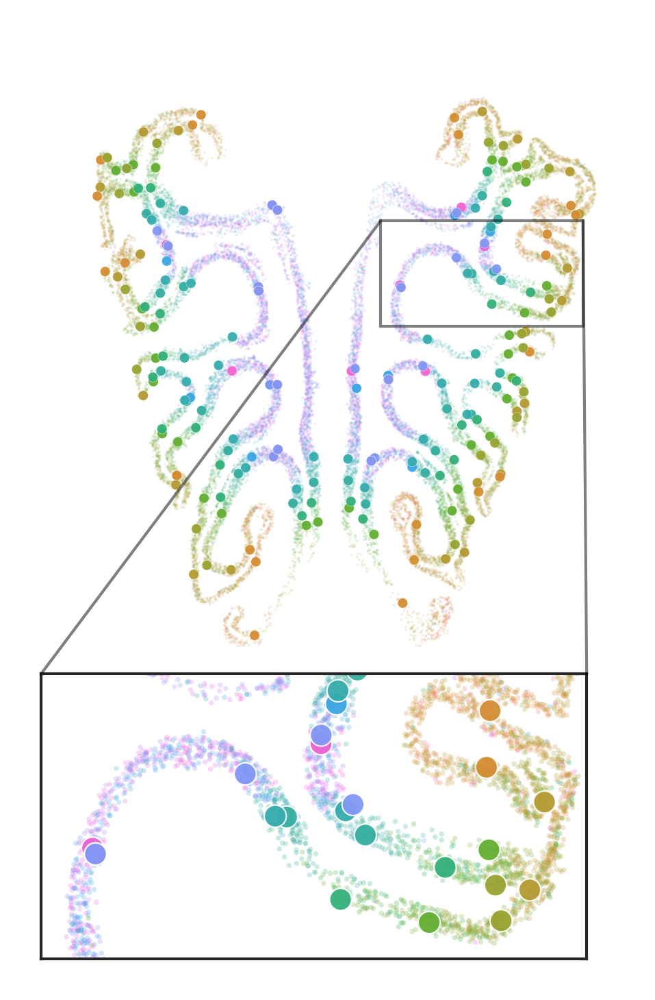

In [22]:
with moe_style_context():
    fig, ax = plt.subplots(figsize=(2, 2))
    ax.scatter(
        _xt,
        _yt,
        c=df_res.DV,
        vmin=-350,
        vmax=350,
        cmap=dv_cmap,
        lw=0.0,
        alpha=0.15,
        s=0.2,
        rasterized=True,
    )
    is_olfr = df_average.gene.isin(olfrs_plot)
    im = scat2 = ax.scatter(
        axt[is_olfr],
        ayt[is_olfr],
        s=3,
        c=df_average.DV[is_olfr],
        vmin=-350,
        vmax=350,
        cmap=dv_cmap,
        lw=0.05,
        ec="w",
        alpha=0.95
    )
    update_ax(ax)
    axins = ax.inset_axes(
            [-0.05, -0.45, 1, 0.45],
            facecolor=None,
            zorder=-10,
            xlim=(320, 1950),
            ylim=(200, 1050),
        )
    axins.scatter(
        _xt,
        _yt,
        c=df_res.DV,
        vmin=-350,
        vmax=350,
        cmap=dv_cmap,
        lw=0,
        alpha=0.25,
        s=0.8,
        rasterized=True,
    )
    axins.scatter(
        axt[is_olfr],
        ayt[is_olfr],
        s=15,
        c=df_average.DV[is_olfr],
        vmin=-350,
        vmax=350,
        cmap=dv_cmap,
        lw=0.25,
        ec="w",
        alpha=0.95
    )
    axins.set_xticks([])
    axins.set_yticks([])
    # axins.yaxis.set_major_locator(mpl.ticker.MultipleLocator(0.2))
    for spine in axins.spines.values():
        spine.set_linewidth(0.5)
    inset_indicator = ax.indicate_inset_zoom(axins, edgecolor="black", linewidth=0.5)
    for c in inset_indicator[1]:
        c.set_linewidth(0.5)

# Stereo-seq

In [23]:
df, df_sum_rot = io.load_stereo_seq()
df_predictions = df.groupby(["olfr_cat"], observed=True)[["DV", "pred"]].mean()

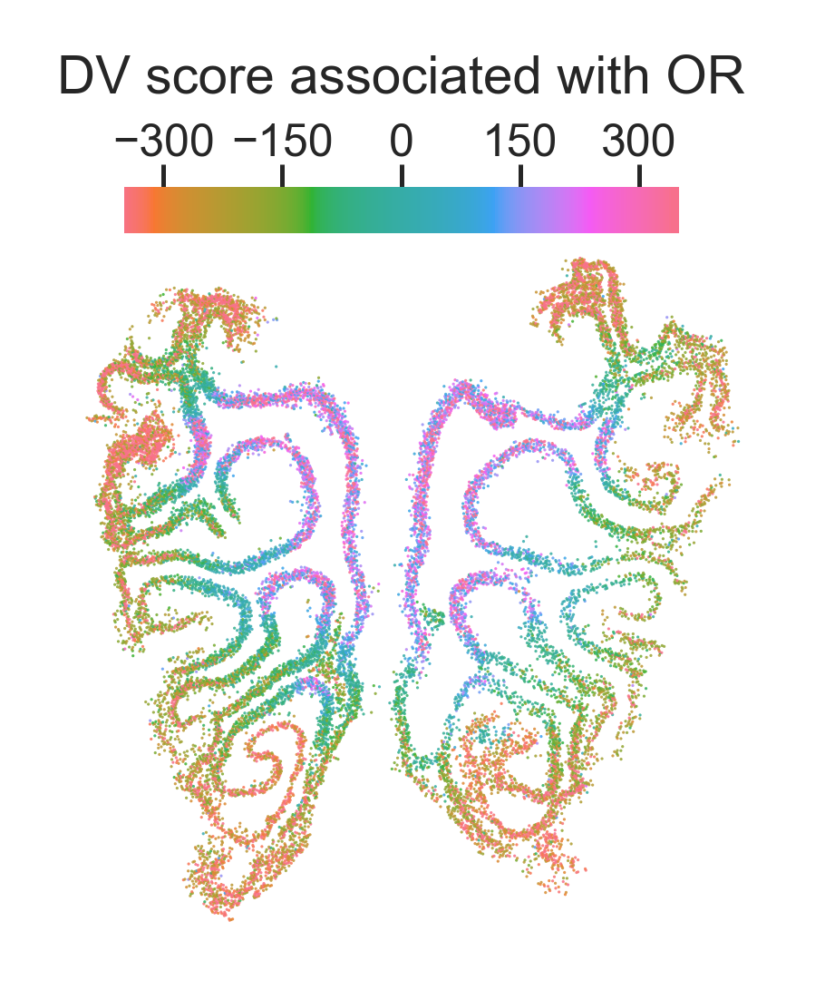

In [24]:
with moe_style_context():
    fig, ax = plt.subplots(1, 1, figsize=(1.7, 1.7), sharex=True, sharey=True)
    im = ax.scatter(
        df_sum_rot.x_rot,
        df_sum_rot.y_rot,
        c=df_sum_rot.DV,
        lw=0,
        alpha=0.85,
        s=0.15,
        vmin=-350,
        vmax=350,
        cmap=dv_cmap,
        rasterized=True,
    )
    ax.axis("equal")
    ax.axis("off")
    cbar, cb_ax = viz.add_horz_cbar(im, fig, pos=[0.2, 0.88, 0.6, 0.05])
    cbar.set_label("DV score associated with OR")
    cb_ax.xaxis.set_major_locator(mpl.ticker.MultipleLocator(150))

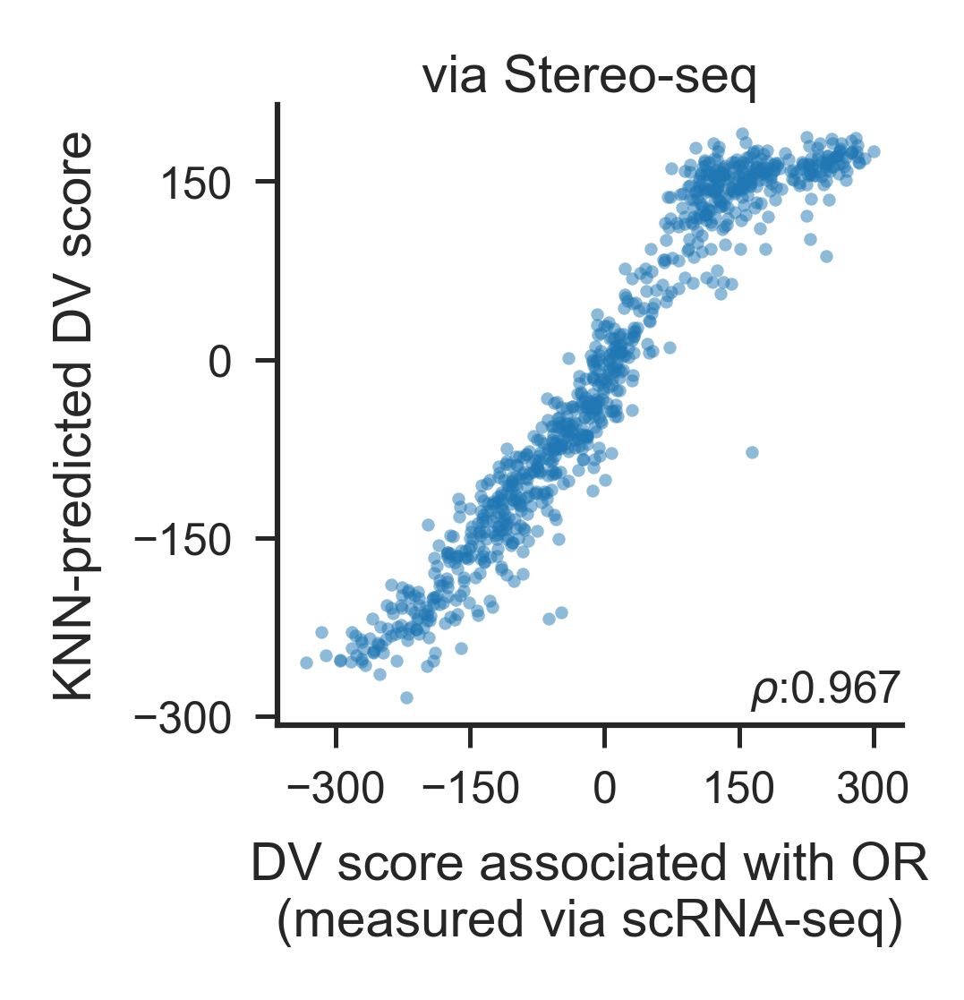

In [25]:
with moe_style_context():
    fig, ax = plt.subplots(figsize=(1.5, 1.5))
    ax.scatter(df_predictions.DV, df_predictions.pred, s=3, alpha=0.5, lw=0)
    ax.yaxis.set_major_locator(mpl.ticker.MultipleLocator(150))
    ax.xaxis.set_major_locator(mpl.ticker.MultipleLocator(150))
    ax.set_xlabel("DV score associated with OR\n(measured via scRNA-seq)")
    ax.set_ylabel("KNN-predicted DV score")
    ax.set_title("via Stereo-seq", y=0.95)
    viz.plot_r(ax, df_predictions.DV, df_predictions.pred)
    sns.despine()

In [26]:
# comparison across stereo-seq datasets
ct = pd.crosstab(df.olfr_cat, df.SN)
enough_cells = ct.index[(ct >= 2).all(1)]

df_sn_mean = (
    df[df.olfr_cat.isin(enough_cells)]
    .groupby(["olfr_cat", "SN"], observed=True, as_index=False)[["pred"]]
    .mean()
    .pivot(index="olfr_cat", columns=["SN"], values="pred")
)
G5, C3 = df_sn_mean.columns

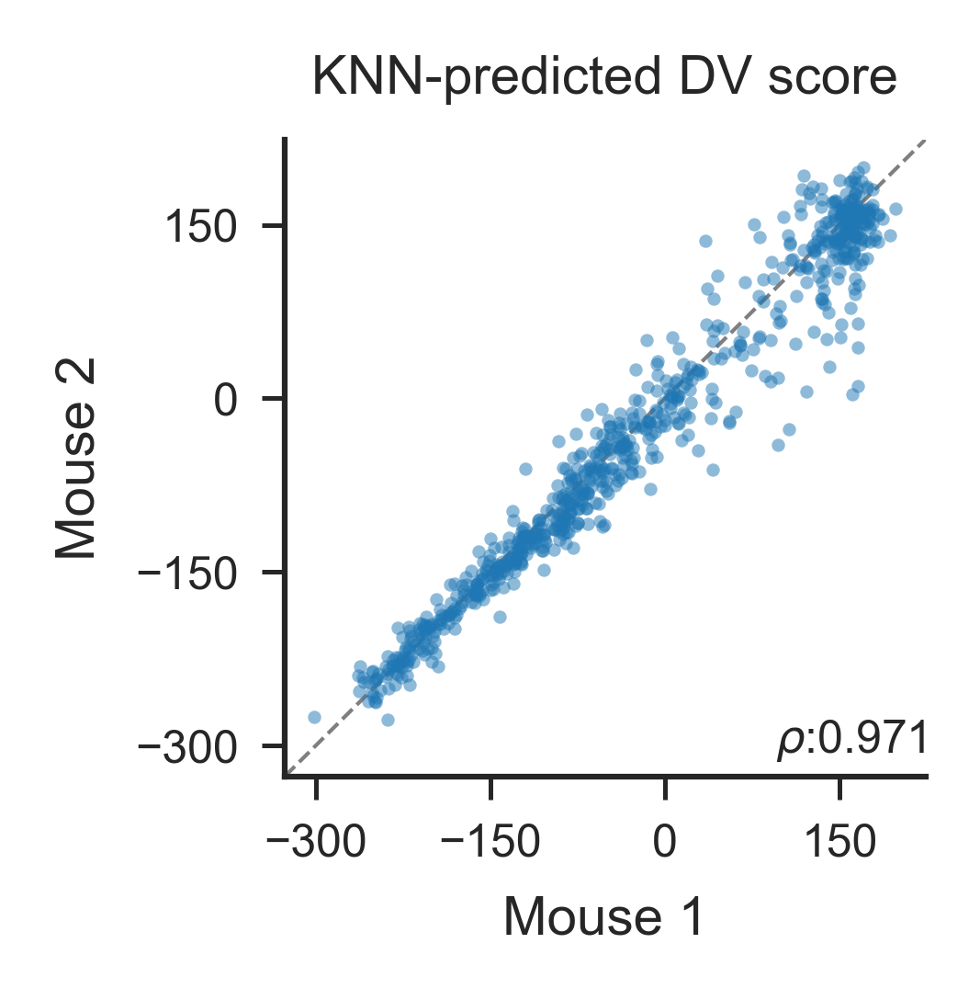

In [27]:
with moe_style_context():
    fig, ax = plt.subplots(figsize=(1.5, 1.5))
    ax.scatter(df_sn_mean[C3], df_sn_mean[G5], s=3, alpha=0.5, lw=0)
    viz.plot_r(ax, df_sn_mean[C3], df_sn_mean[G5])
    viz.adjust_lims(ax, lw=0.5)
    ax.set_xlabel("Mouse 1")
    ax.set_ylabel("Mouse 2")
    sns.despine()
    ax.yaxis.set_major_locator(mpl.ticker.MultipleLocator(150))
    ax.xaxis.set_major_locator(mpl.ticker.MultipleLocator(150))
    ax.set_title("KNN-predicted DV score")

# comparisons to other datasets
## bulk RNA-seq
* [Tan & Xie 2018](https://doi.org/10.1093/chemse/bjy030)
* [Segura et al. 2022](https://doi.org/10.1016/j.celrep.2022.110547)

In [28]:
df_tan_both = io.load_other_spatial("tan")
df_tan_both = df_tan_both[df_tan_both.has_DV]
df_saraiva_dv = io.load_other_spatial("saraiva")
df_saraiva_dv = df_saraiva_dv[~df_saraiva_dv.DV.isnull()]

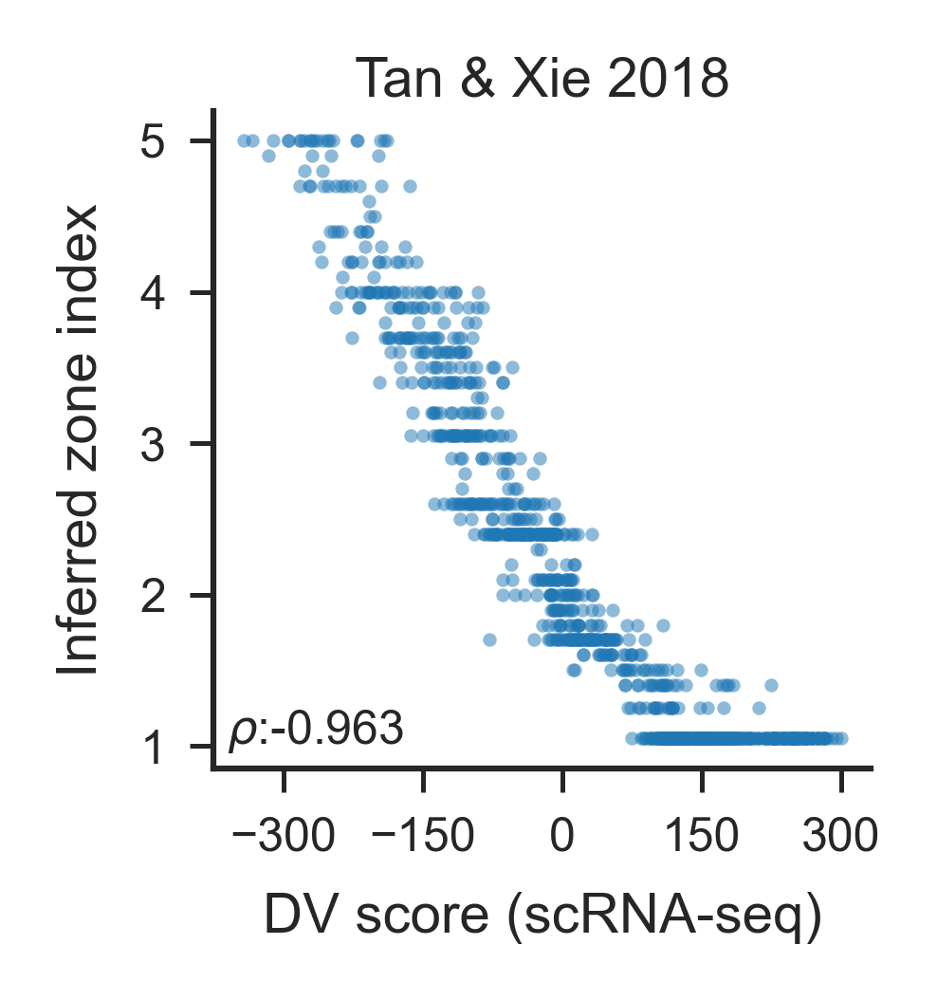

In [29]:
with moe_style_context():
    fig, ax = plt.subplots(figsize=(1.5, 1.5))
    ax.scatter(df_tan_both.DV, df_tan_both.inferred_zone_index, alpha=0.5, s=3, lw=0)
    viz.plot_r(
        ax, df_tan_both.DV, df_tan_both.inferred_zone_index, r_loc=(0.02, 0.02), ha="left"
    )
    sns.despine()
    ax.set_xlabel("DV score (scRNA-seq)")
    ax.set_ylabel("Inferred zone index")
    ax.set_title("Tan & Xie 2018", y=0.95)
    ax.set_box_aspect(1)
    ax.xaxis.set_major_locator(mpl.ticker.MultipleLocator(150))
    ax.yaxis.set_major_locator(mpl.ticker.MultipleLocator(1))

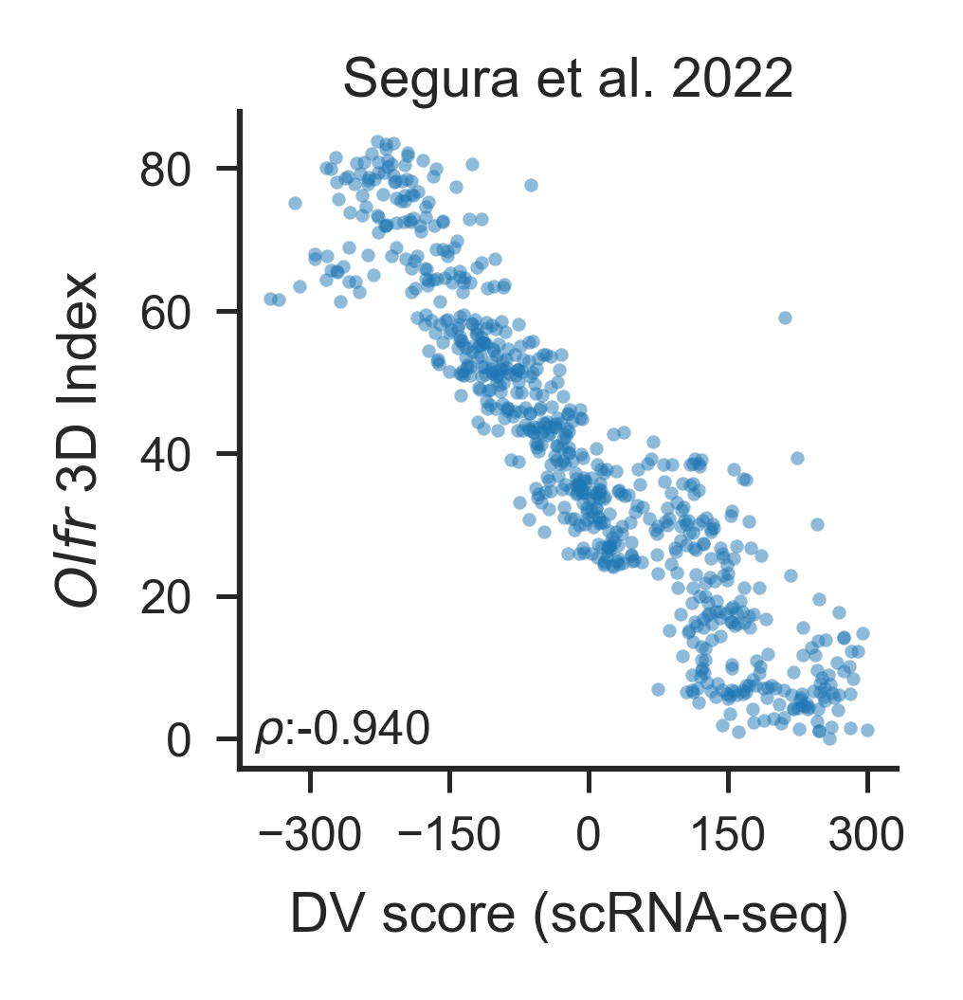

In [30]:
with moe_style_context():
    fig, ax = plt.subplots(figsize=(1.5, 1.5))
    ax.scatter(df_saraiva_dv.DV, df_saraiva_dv["3Dindex"], alpha=0.5, s=3, lw=0)
    viz.plot_r(
        ax, df_saraiva_dv.DV, df_saraiva_dv["3Dindex"], r_loc=(0.02, 0.02), ha="left"
    )
    sns.despine()
    ax.set_xlabel("DV score (scRNA-seq)")
    ax.set_ylabel("$Olfr$ 3D Index")
    ax.set_title("Segura et al. 2022", y=0.95)
    ax.set_box_aspect(1)
    ax.xaxis.set_major_locator(mpl.ticker.MultipleLocator(150))
    ax.yaxis.set_major_locator(mpl.ticker.MultipleLocator(20))

## Bintu et al. MERFISH
* see preprint from Bintu et al. [here](https://doi.org/10.1101/2025.05.02.651832)
* data downloaded from the Brain Imaging Library (BIL, dataset ID: ace-bag-tin, linked [here](https://download.brainimagelibrary.org/3d/91/3d9109168823fe39/)) and reanalyzed

In [31]:
df_pred_keep = spatial.filter_bintu(io.load_other_spatial("bintu"))
vc_fish = df_pred_keep.olfactory_receptor_gene.value_counts()
df_pred_mean = df_pred_keep.groupby("olfactory_receptor_gene")[["DV", "pred"]].mean()

In [32]:
df_gep_mean = io.load_gep_mean().to_pandas().set_index("top_Olfr")
df_all_dv = df_pred_keep.merge(
    df_gep_mean[["DV", "AP"]],
    left_on="olfactory_receptor_gene",
    right_index=True,
    how="inner",
    suffixes=(None, "_new"),
)

In [33]:
# example section
is_best = (
    (df_all_dv.mouse_num == 5)
    & (df_all_dv.rep_num == 1)
    & (df_all_dv.slice_id == 2)
)
df_best = df_all_dv[is_best]
rot_keep, isolated = spatial.rotate_section(df_best)

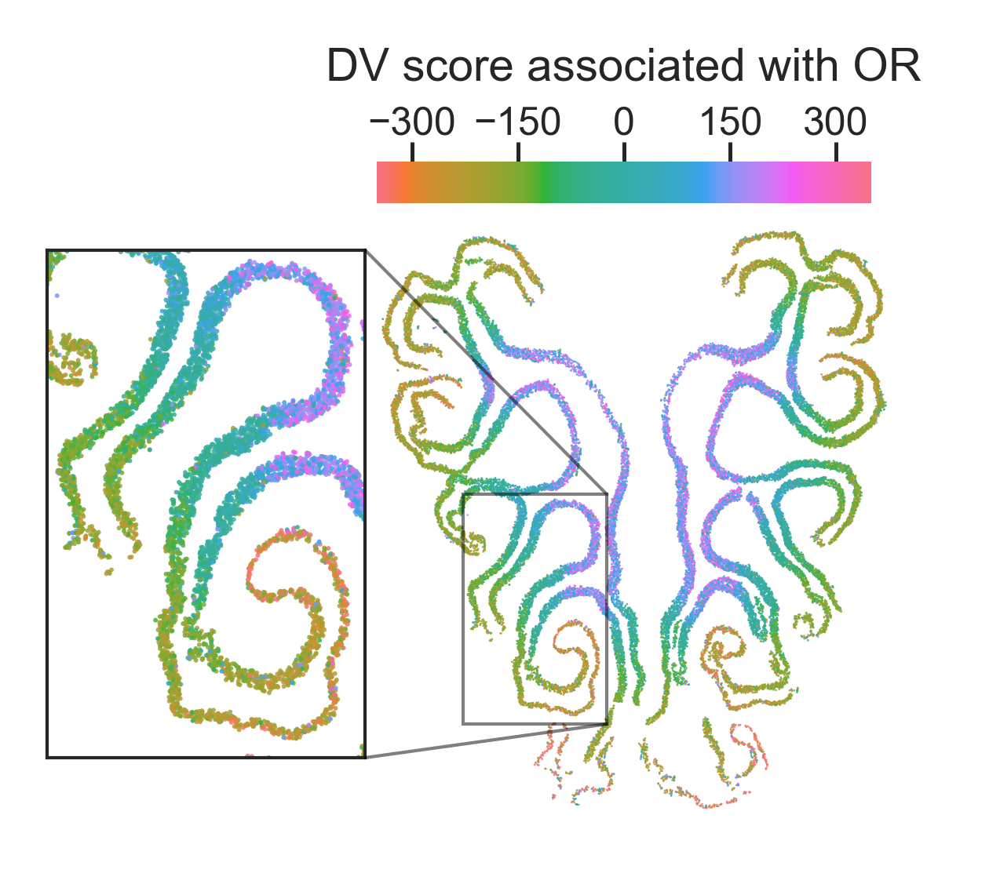

In [34]:
with moe_style_context():
    fig, ax = plt.subplots(1, 1, figsize=(1.75, 1.75), sharex=True, sharey=True)
    im = ax.scatter(
        rot_keep[:, 0],
        rot_keep[:, 1],
        c=df_best.DV_new[~isolated],
        lw=0,
        alpha=0.85,
        s=0.1,
        vmin=-350,
        vmax=350,
        cmap=dv_cmap,
        rasterized=True,
    )
    ax.axis("equal")
    ax.axis("off")
    cbar, cb_ax = viz.add_horz_cbar(im, fig, pos=[0.2, 0.88, 0.6, 0.05])
    cbar.set_label("DV score associated with OR")
    cb_ax.xaxis.set_major_locator(mpl.ticker.MultipleLocator(150))

    axins = ax.inset_axes(
        [-0.42, 0.125, 0.5, 0.8],
        facecolor=None,
        zorder=-10,
        xlim=(-1600, -340),
        ylim=(-7750, -5740),
    )
    axins.scatter(
        rot_keep[:, 0],
        rot_keep[:, 1],
        c=df_best.DV_new[~isolated],
        lw=0,
        alpha=0.85,
        s=0.5,
        vmin=-350,
        vmax=350,
        cmap=dv_cmap,
        rasterized=True,
    )
    axins.set_xticks([])
    axins.set_yticks([])
    # axins.yaxis.set_major_locator(mpl.ticker.MultipleLocator(0.2))
    for spine in axins.spines.values():
        spine.set_linewidth(0.5)

    axins.set_aspect("equal")

    inset_indicator = ax.indicate_inset_zoom(axins, edgecolor="black", linewidth=0.5)
    for c in inset_indicator[1]:
        c.set_linewidth(0.5)

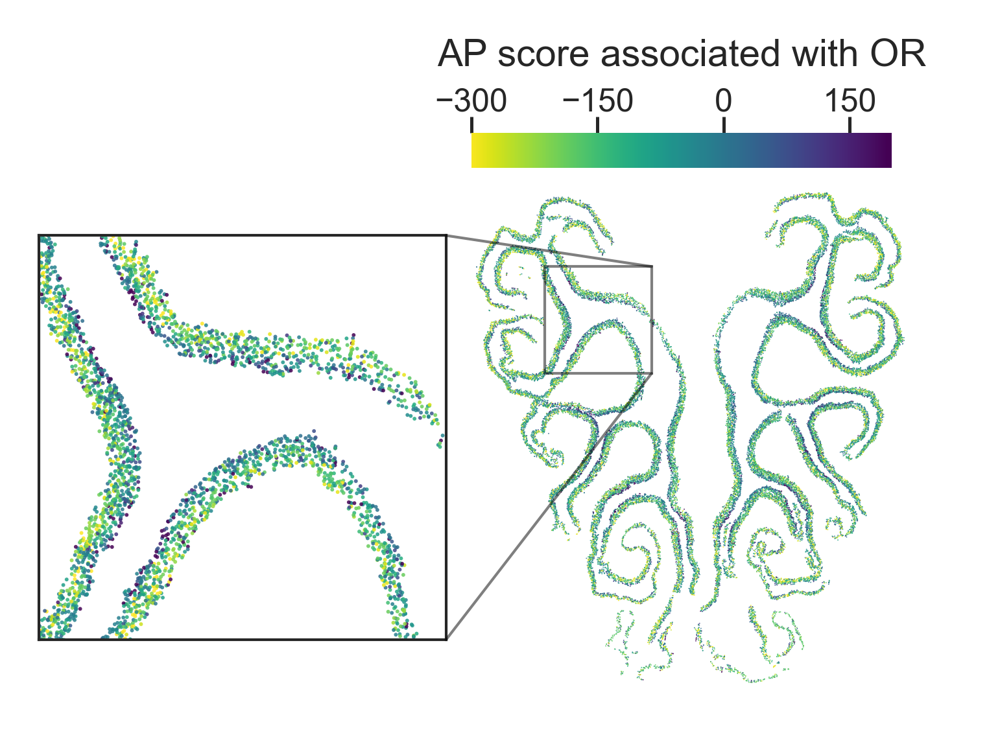

In [35]:
with moe_style_context():
    fig, ax = plt.subplots(1, 1, figsize=(1.8, 1.8), sharex=True, sharey=True)
    im = ax.scatter(
        rot_keep[:, 0],
        rot_keep[:, 1],
        c=df_best.AP_new[~isolated],
        lw=0,
        alpha=0.85,
        s=0.05,
        vmin=-300,
        vmax=200,
        cmap="viridis_r",
        rasterized=True,
    )
    ax.axis("equal")
    ax.axis("off")
    cbar, cb_ax = viz.add_horz_cbar(im, fig, pos=[0.2, 0.88, 0.6, 0.05])
    cbar.set_label("AP score associated with OR")
    cb_ax.xaxis.set_major_locator(mpl.ticker.MultipleLocator(150))
    axins = ax.inset_axes(
        [-0.7, 0.125, 0.75, 0.75],
        facecolor=None,
        zorder=-10,
        xlim=(-1600, -500),
        ylim=(-5300, -4200),
    )
    axins.scatter(
        rot_keep[:, 0],
        rot_keep[:, 1],
        c=df_best.AP_new[~isolated],
        lw=0,
        alpha=0.85,
        s=0.5,
        vmin=-300,
        vmax=200,
        cmap="viridis_r",
        rasterized=True,
    )
    axins.set_xticks([])
    axins.set_yticks([])
    for spine in axins.spines.values():
        spine.set_linewidth(0.5)
    inset_indicator = ax.indicate_inset_zoom(axins, edgecolor="black", linewidth=0.5)
    for c in inset_indicator[1]:
        c.set_linewidth(0.5)

### Comparison with Bintu et al. data
* High residuals between predicted and observed DV scores indicates many ORs in the Bintu MERFISH data are not near neighbors with similar DV scores. 
* Given the correspondence between spatial positions and DV scores in other datasets (e.g. the MERFISH and stereo-seq data from Brann et al.); it is unlike that those yellow ORs below with a dorsal DV score (and expression of dorsal markers) would be located in the ventral region of the epithelium, and vice versa for blue ORs.
* These could potentially due to cross-hybridization of probes. Alternatively, if the MERFISH probes didn't detect any cells (e.g. failed to hybridize), the 3D convolution decoding approach of Bintu et al. may also yield false positive detections
* Similar outliers are seen comparing Bintu et al's "Central-peripheral index" and the DV score. Note that the Central-peripheral index is defined using the MERFISH data directly, so there is no orthogonal validation of the spatial positions (since a given spatial position via MERFISH is by definition equal to its Central-peripheral index, which cannot account for false-positive detections)
* Not shown below, but there are also many similar discrepancies between DV scores and putative olfactory bulb glomeruli positions in the Bintu et al. olfactory bulb MERFISH dataset. 

In [36]:
df_mature = io.load_df_dv(apply_filter=False, add_qt=False)
vc = df_mature["top_Olfr"].value_counts()
# keep cells with at least 20 cells in either dataset
df_seq = (
    df_mature.group_by("top_Olfr")
    .agg(pl.col("DV").mean())
    .join(vc, on="top_Olfr")
    .filter(pl.col("count") >= 20)
    .to_pandas()
    .set_index("top_Olfr")
)
df_plot = df_pred_mean.loc[vc_fish.index[vc_fish >= 20]].join(
    df_seq, rsuffix="_new", how="inner"
)
df_plot["residual"] = df_plot["pred"] - df_plot["DV_new"]

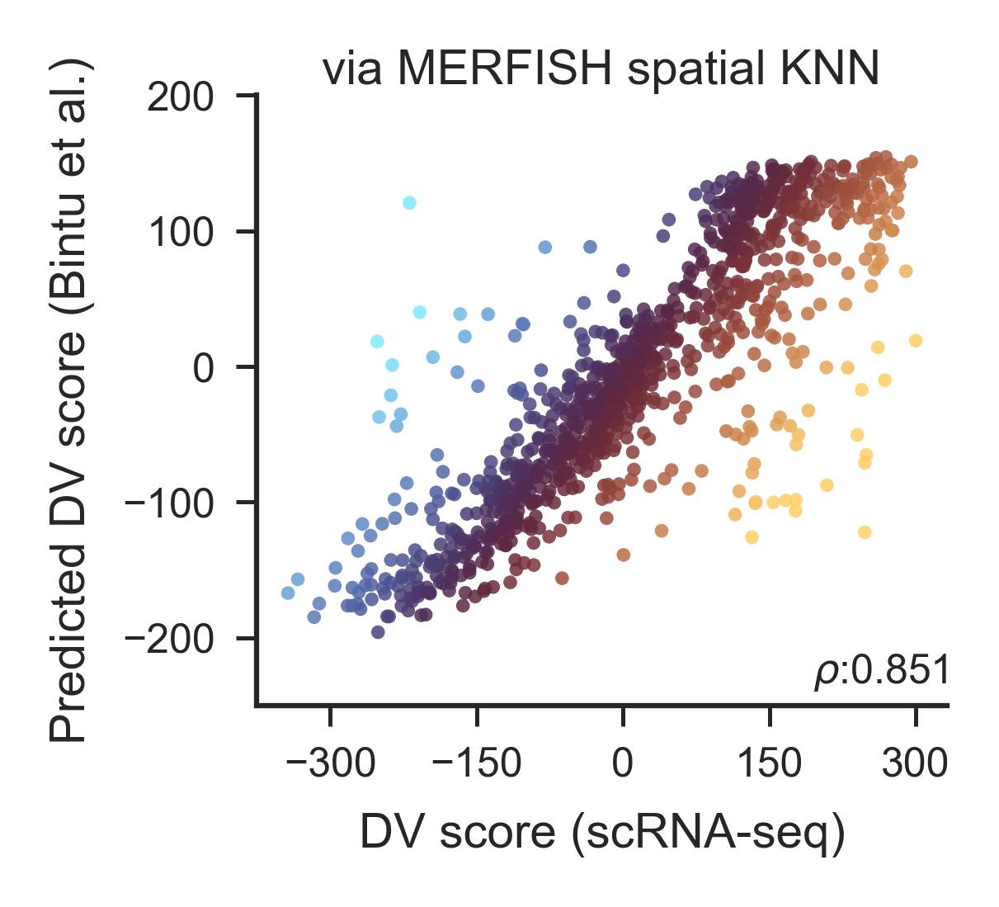

In [37]:
with moe_style_context():
    fig, ax = plt.subplots(figsize=(1.8, 1.6))
    im = ax.scatter(
        df_plot.DV_new,
        df_plot.pred,
        c=df_plot.residual,
        alpha=0.85,
        s=4,
        lw=0,
        vmin=-250,
        vmax=250,
        cmap=cmcrameri.cm.managua,
    )
    viz.plot_r(ax, df_plot.DV_new, df_plot.pred)
    ax.set_xlabel("DV score (scRNA-seq)")
    ax.set_ylabel("Predicted DV score (Bintu et al.)")
    sns.despine()
    ax.xaxis.set_major_locator(mpl.ticker.MultipleLocator(150))
    ax.yaxis.set_major_locator(mpl.ticker.MultipleLocator(100))
    ax.set_ylim(-250, 200)
    ax.set_title("via MERFISH spatial KNN", y=0.95)


In [38]:
def compare(
    _df,
    c_col="DV",
    plot_kwargs=dict(
        s=5, alpha=0.85, lw=0.2, ec="0.5"
    ),
):
    _x = _df["global_knn"]
    _y = _df["pred"]
    c = _df[c_col]
    fig, ax = plt.subplots(figsize=(1.6, 1.6))

    im = ax.scatter(
        _x,
        _y,
        c=c,
        cmap=dv_cmap,
        vmin=-350,
        vmax=350,
        **plot_kwargs
        
    )
    ax.set_xlim(-280, 220)
    viz.adjust_lims(ax, lw=0.5)
    viz.plot_r(ax, _x, _y)
    ax.set_box_aspect(1)
    sns.despine()
    ax.xaxis.set_major_locator(mpl.ticker.MultipleLocator(100))
    ax.yaxis.set_major_locator(mpl.ticker.MultipleLocator(100))
    cb_ax = fig.add_axes([0.2, 0.8, 0.5, 0.05])
    cbar = plt.colorbar(im, cb_ax, orientation="horizontal")
    cbar.set_label("DV score (scRNA-seq)")
    cb_ax.xaxis.set_label_position("top")
    cb_ax.xaxis.set_ticks_position("top")
    cb_ax.xaxis.set_tick_params(pad=0)
    cb_ax.xaxis.set_major_locator(mpl.ticker.MultipleLocator(200))
    cbar.solids.set_alpha(1)
    viz.update_cbar(cbar)
    return fig, ax

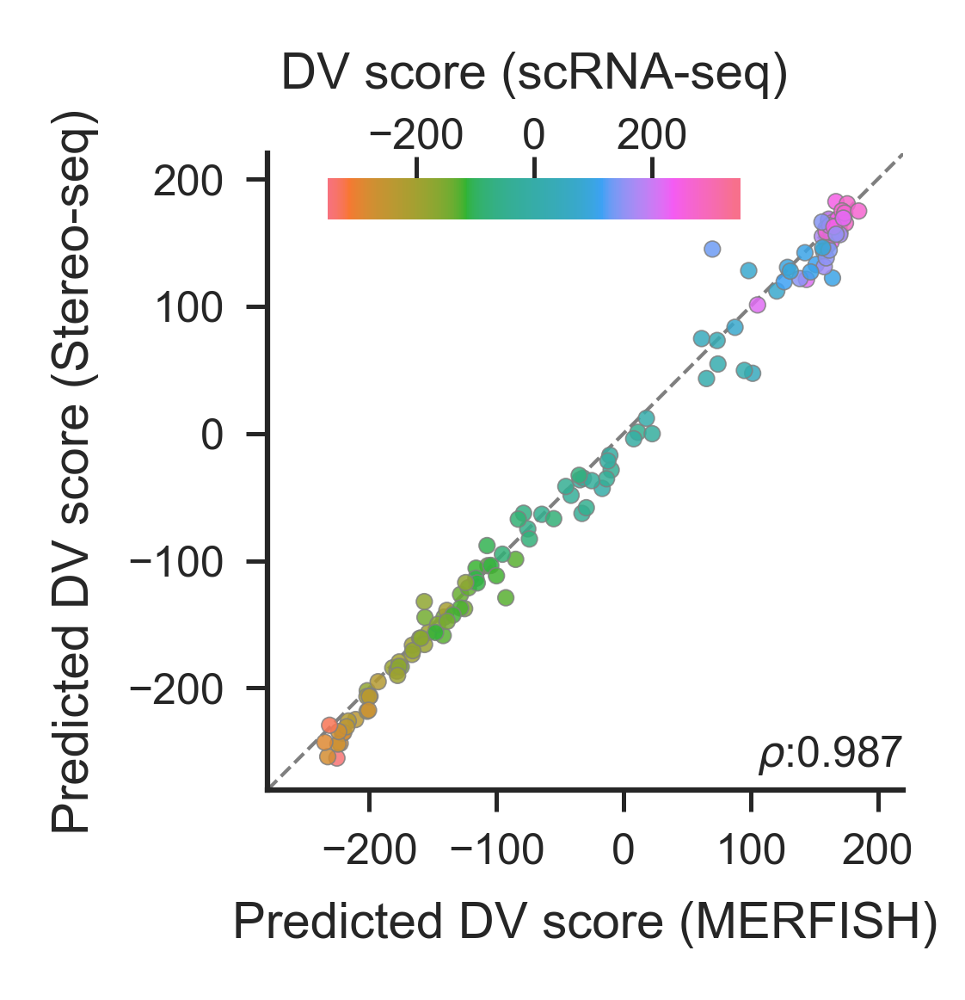

In [39]:
df_merf_stereo = df_trans_gene_mean.loc[res_use].join(df_predictions, how="inner")

with moe_style_context():
    fig, ax = compare(df_merf_stereo)
    ax.set_ylabel("Predicted DV score (Stereo-seq)")
    ax.set_xlabel("Predicted DV score (MERFISH)")

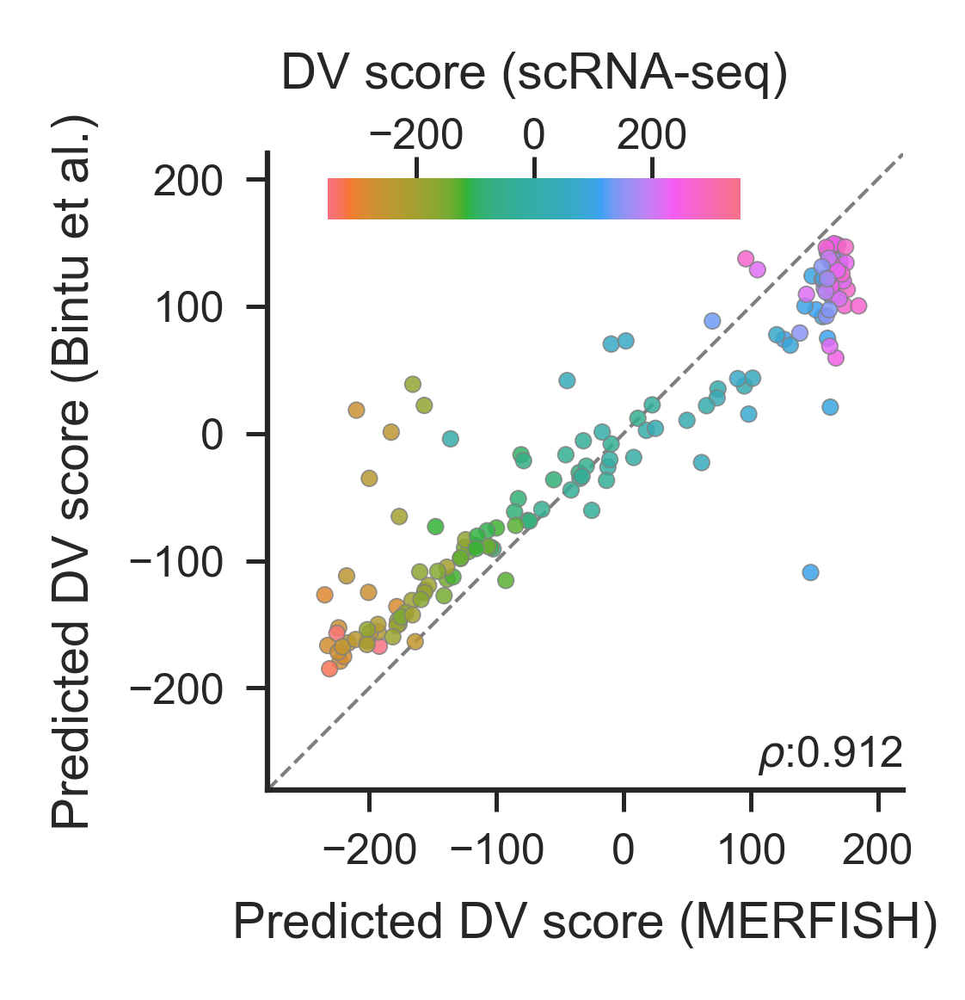

In [40]:
# lots more discrepancies
df_res_bintu = df_trans_gene_mean.join(df_plot, how="inner", rsuffix="_bintu")

with moe_style_context():
    fig, ax = compare(df_res_bintu, c_col="y_DV")
    ax.set_ylabel("Predicted DV score (Bintu et al.)")
    ax.set_xlabel("Predicted DV score (MERFISH)")

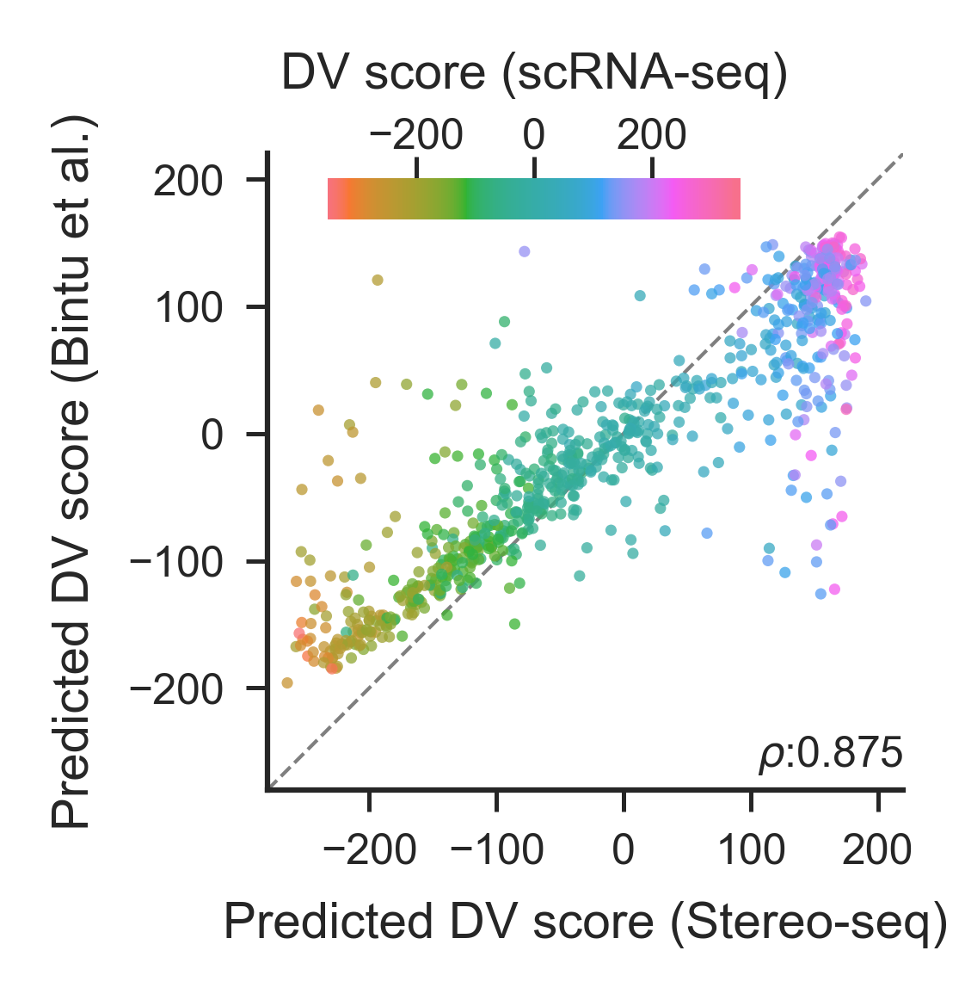

In [41]:
# lots more discrepancies again
df_stereo_bintu = df_predictions.rename(columns={"pred": "global_knn"}).join(
    df_plot, how="inner", rsuffix="_Bintu"
)

with moe_style_context():
    fig, ax = compare(df_stereo_bintu, plot_kwargs=dict(s=2.5, alpha=0.75, lw=0))
    ax.set_ylabel("Predicted DV score (Bintu et al.)")
    ax.set_xlabel("Predicted DV score (Stereo-seq)")

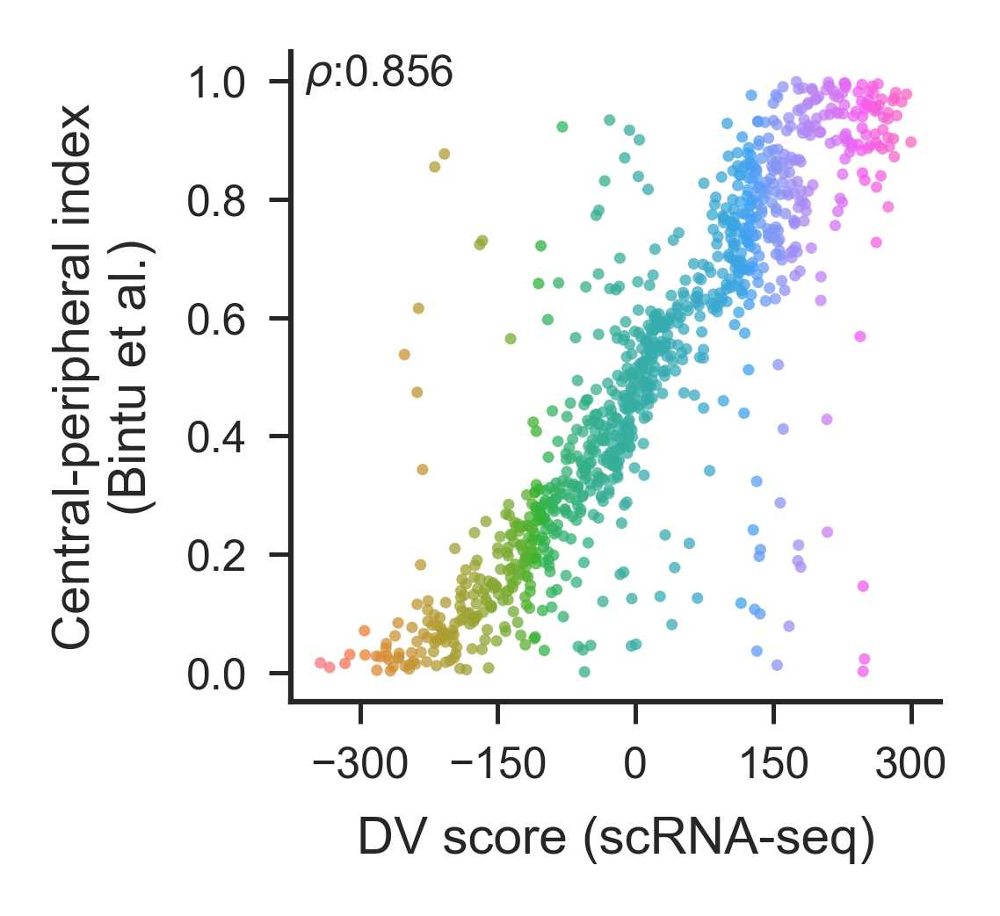

In [42]:
# compare to central-peripheral index
df_index = io.load_bintu_index()
df_bintu2 = df_index.join(df_plot, how="inner")
_x = df_bintu2.DV_new
_y = df_bintu2.central_to_peripheral_index

with moe_style_context():
    fig, ax = plt.subplots(figsize=(1.6, 1.6))
    im = ax.scatter(
        _x,
        _y,
        c=_x,
        cmap=dv_cmap,
        vmin=-350,
        vmax=350,
        s=2.5, alpha=0.75, lw=0
        
    )
    viz.plot_r(ax, _x, _y, r_loc=(0.02, 1.0), ha="left", va="top")
    ax.set_box_aspect(1)
    sns.despine()
    ax.xaxis.set_major_locator(mpl.ticker.MultipleLocator(150))
    ax.yaxis.set_major_locator(mpl.ticker.MultipleLocator(0.2))
    ax.set_xlabel("DV score (scRNA-seq)")
    ax.set_ylabel("Central-peripheral index\n(Bintu et al.)")

# AP score vs apical-basal distance

In [43]:
df_subsets, df_corr = spatial.get_apical_basal()
folders = io.get_data_folders()

df_mature = pl.read_parquet(folders.processed / "DV_score_all_mature_OSNs.parquet")
ap_example_olfr = ["Olfr1389", "Olfr1340", "Olfr1173", "Olfr1132", "Olfr358", "Olfr107"]
df_subset_melt = (
    df_mature.filter(pl.col("top_Olfr").is_in(ap_example_olfr))
    .unpivot(index=["top_Olfr"], on=["AP", "DV"])
    .to_pandas()
)

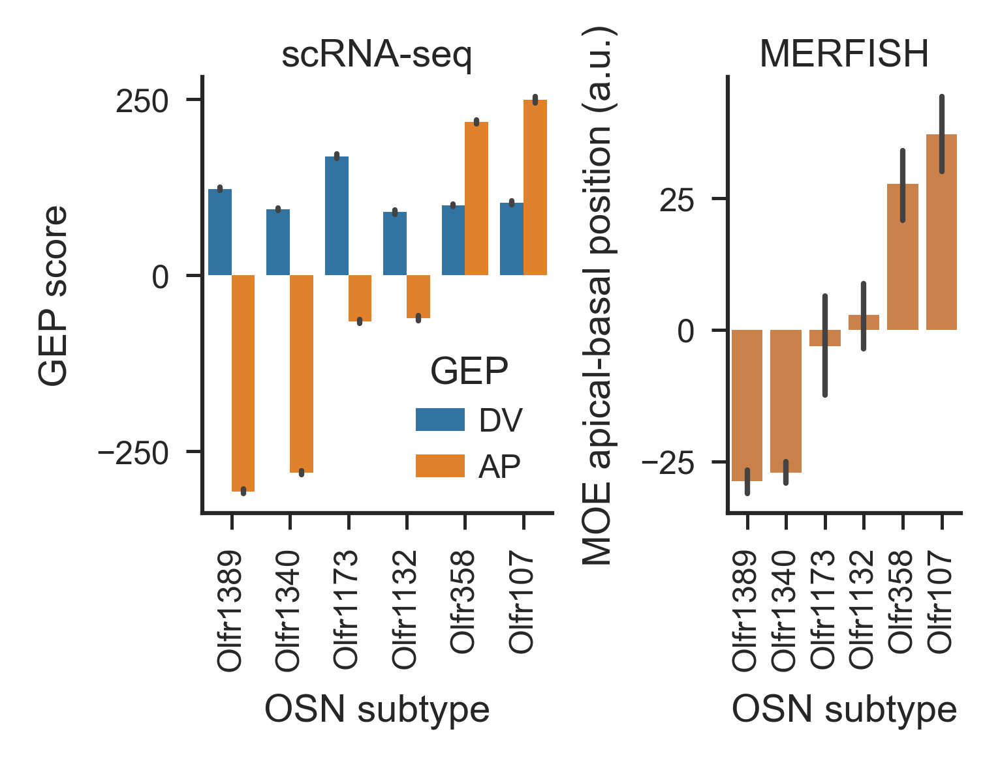

In [44]:
with moe_style_context():
    fig, axes = plt.subplots(
        1, 2, figsize=(2.5, 1.45), sharex=True, gridspec_kw={"width_ratios": [1.5, 1]}
    )

    ax0, ax = axes

    sns.barplot(
        data=df_subset_melt,
        x="top_Olfr",
        y="value",
        hue="variable",
        ax=ax0,
        order=ap_example_olfr,
        lw=0.,
        err_kws={"linewidth": 1},
        hue_order=["DV", "AP"],
    )
    ax0.legend(title="GEP", handlelength=1.5, handletextpad=0.4)

    sns.barplot(
        data=df_subsets["Bintu"],
        x="gene",
        y="ab_dist",
        order=ap_example_olfr,
        ax=ax,
        color=plt.cm.Dark2(1),
        err_kws={"linewidth": 1},
        linewidth=0,
        alpha=0.8
    )
    for ax in axes:
        ax.set_xticks(np.arange(len(ap_example_olfr)))
        ax.set_xticklabels(ap_example_olfr, rotation=90)
        ax.set_xlabel("OSN subtype")
    ax0.set_ylabel("GEP score")
    ax0.set_title("scRNA-seq", y=0.95)
    ax.set_ylabel("MOE apical-basal position (a.u.)")
    ax.set_title("MERFISH", y=0.95)
    sns.despine()
    plt.subplots_adjust(wspace=0.6)

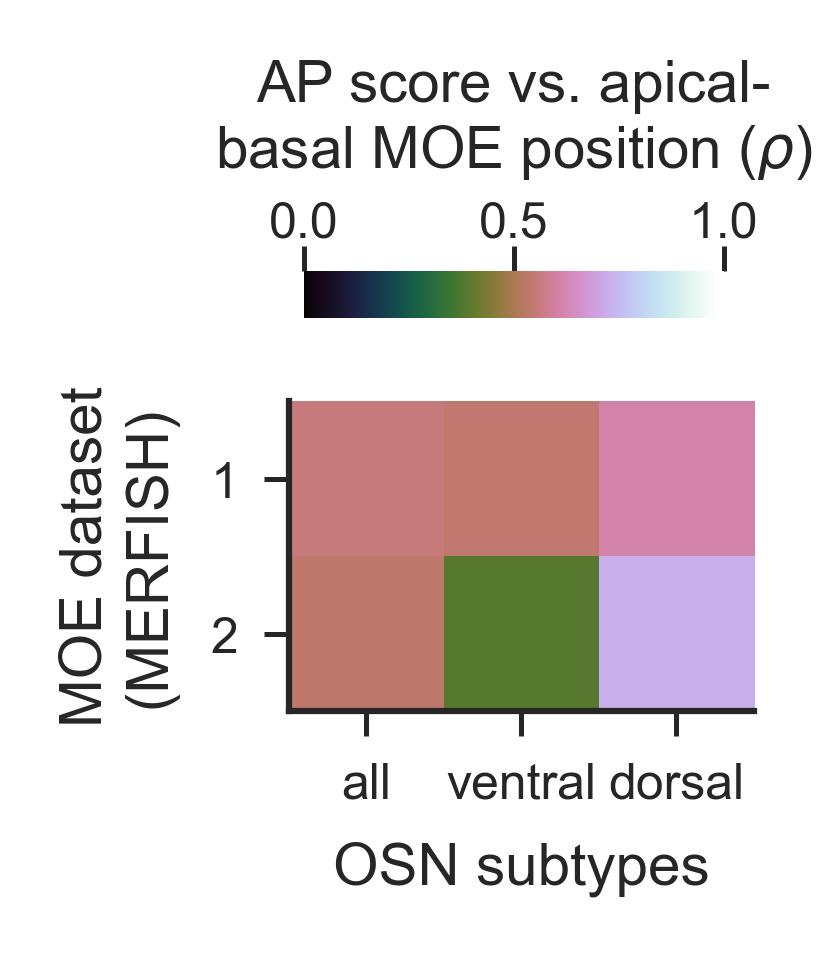

In [45]:
with moe_style_context():
    fig, ax = plt.subplots(figsize=(1, 1.3))
    im = ax.imshow(df_corr, vmin=0, vmax=1, cmap="cubehelix")
    ax.set_yticks([0,1])
    ax.set_yticklabels(["1", "2"])
    ax.set_ylabel("MOE dataset\n(MERFISH)")
    sns.despine()
    ax.set_xticks(np.arange(3))
    ax.set_xticklabels(df_corr.columns)
    ax.set_xlabel("OSN subtypes")
    cbar, cb_ax = viz.add_horz_cbar(im, fig, [0.15, 0.8, 0.7, 0.06])
    cb_ax.xaxis.set_major_locator(mpl.ticker.MultipleLocator(0.5))
    cbar.set_label("AP score vs. apical-\n" + r"basal MOE position ($\rho$)")